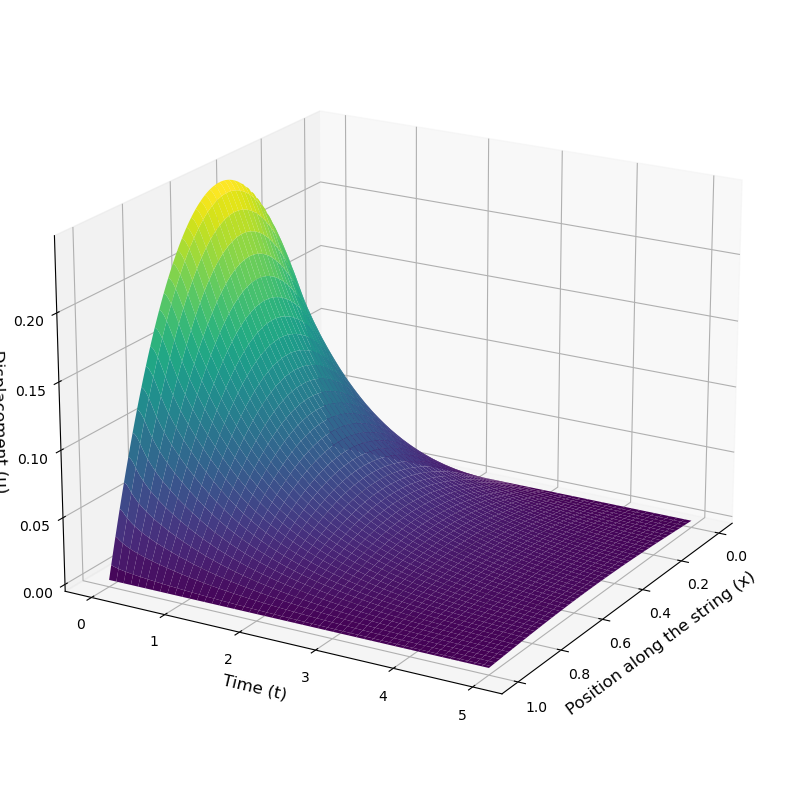

In [223]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from mpl_toolkits.mplot3d import Axes3D


L = 1.0  
beta = 4*np.pi/L 
N = 100  
x = np.linspace(0, L, N)  
dx = x[1] - x[0]  


u0 = x * (L - x)  
ut0 = np.zeros(N)  


def damped_wave(t, u):
    u_xx = np.zeros(N)
    u_xx[1:-1] = (u[:N-2] - 2*u[1:N-1] + u[2:N]) / dx**2  
    u_xx[0] = u_xx[-1] = 0  
    return np.concatenate((u[N:], -beta*u[N:] + u_xx))

u_init = np.concatenate((u0, ut0))


t_span = (0, 5)  
t_eval = np.linspace(t_span[0], t_span[1], 500)  


sol = solve_ivp(damped_wave, t_span, u_init, t_eval=t_eval)


X, T = np.meshgrid(x, t_eval)
U = sol.y[:N, :]


fig = plt.figure(figsize=(10, 8))  
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, T, U.T, cmap='viridis')


ax.set_xlabel('Position along the string (x)', fontsize=12)
ax.set_ylabel('Time (t)', fontsize=12)
ax.set_zlabel('Displacement (u)', fontsize=12)


ax.view_init(elev=20, azim=30)


plt.subplots_adjust(left=0.12, right=0.88, top=0.88, bottom=0.12)
plt.tight_layout()  


plt.savefig('4bvibrations.png', dpi=600) 
plt.show()

In [180]:
import numpy as np
import plotly.graph_objects as go
from scipy.integrate import solve_ivp

# 参数设置
L = 1.0  # 绳子的长度
beta = (4 * np.pi)/L  # 小的阻尼系数
N = 100  # 空间离散点数
x = np.linspace(0, L, N)  # 空间网格
dx = x[1] - x[0]  # 空间步长

# 初始条件
u0 = x * (L - x)  # 初始位移
ut0 = np.zeros(N)  # 初始速度

# 定义 PDE 的右侧
def damped_wave(t, u):
    u_xx = np.zeros(N)
    # 计算 u_xx，确保切片的形状匹配
    u_xx[1:-1] = (u[:N-2] - 2*u[1:N-1] + u[2:N]) / dx**2  # 中心差分法
    u_xx[0] = u_xx[-1] = 0  # 边界条件
    return np.concatenate((u[N:], -beta*u[N:] + u_xx))

# 拼接初始条件
u_init = np.concatenate((u0, ut0))

# 时间范围
t_span = (0, 2)  # 时间范围
t_eval = np.linspace(t_span[0], t_span[1], 500)  # 评估时间点

# 求解 PDE
sol = solve_ivp(damped_wave, t_span, u_init, t_eval=t_eval)

# 创建三维图
X, T = np.meshgrid(x, t_eval)
U = sol.y[:N, :]

# 使用 Plotly 创建交互式图
fig = go.Figure(data=[go.Surface(z=U.T, x=X, y=T, colorscale='Viridis')])

# 设置图形标题和标签
fig.update_layout(title='Interactive 3D Plot of Damped String Vibrations',
                  scene=dict(
                      xaxis_title='Position along the string (x)',
                      yaxis_title='Time (t)',
                      zaxis_title='Displacement (u)'
                  ))

# 显示图形
fig.show()

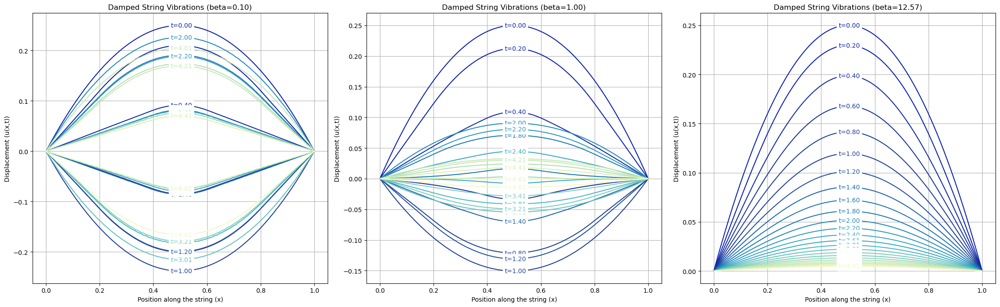

In [214]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Parameter settings
L = 1.0  # Length of the string
N = 100  # Number of spatial discretization points
x = np.linspace(0, L, N)  # Spatial grid
dx = x[1] - x[0]  # Spatial step size

# Initial conditions
u0 = x * (L - x)  # Initial displacement
ut0 = np.zeros(N)  # Initial velocity

# Define the right side of the PDE
def damped_wave(t, u, beta):
    u_xx = np.zeros(N)
    # Calculate u_xx, ensuring the shape of the slices matches
    u_xx[1:-1] = (u[:N-2] - 2 * u[1:N-1] + u[2:N]) / dx**2  # Central difference
    u_xx[0] = u_xx[-1] = 0  # Boundary conditions
    return np.concatenate((u[N:], -beta * u[N:] + u_xx))

# Concatenate initial conditions
u_init = np.concatenate((u0, ut0))

# Time range
t_span = (0, 5)  # Time range
t_eval = np.linspace(t_span[0], t_span[1], 500)  # Evaluation time points

# Different beta values to test
beta_values = [0.1 , 1 ,4*np.pi/L ]

# Color palette
colors = [
    "#0A1FAE", "#1129A7", "#1934A0", "#203F9A", "#2051A1", 
    "#1F65AB", "#1D79B5", "#238ABB", "#2E9ABE", "#38AAC2", 
    "#4AB8C2", "#64C2BE", "#7ECDBB", "#97D6B8", "#AFDFB6", 
    "#C6E8B3", "#DBF0B3", "#E6F4BE", "#F1F8C8", "#FCFDD3"
]

# Plotting
plt.figure(figsize=(15, 5))

# Create subplots for each beta value
for j, beta in enumerate(beta_values):
    # Solve the PDE for the current beta
    sol = solve_ivp(damped_wave, t_span, u_init, args=(beta,), t_eval=t_eval)
    
    plt.subplot(1, 3, j + 1)  # 1 row, 3 columns
    num_colors = len(colors)
    
    # Plot each time step with the color and label
    for i in range(0, len(t_eval), 20):  # Plot every 20 time points
        color_index = int((i / 20) * (num_colors - 1) / (len(t_eval) // 20))
        label = f't={t_eval[i]:.2f}'  # Label to appear on the curve
        y_data = sol.y[:N, i]
        
        # Split the line in two halves and plot separately
        mid_index = len(x) // 2  # Middle index
        plt.plot(x[:mid_index], y_data[:mid_index], color=colors[color_index])  # Plot the first half
        plt.plot(x[mid_index:], y_data[mid_index:], color=colors[color_index])  # Plot the second half
        
        # Add label at the middle of the curve, between the two parts
        mid_value = y_data[mid_index]  # Mid-point value of the displacement
        plt.text(x[mid_index], mid_value, label, color=colors[color_index], fontsize=10, 
                 verticalalignment='center', horizontalalignment='center', 
                 bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3'))

    # Add title and labels
    plt.title(f'Damped String Vibrations (beta={beta:.2f})')
    plt.xlabel('Position along the string (x)')
    plt.ylabel('Displacement (u(x,t))')
    plt.grid()

# Adjust layout
plt.tight_layout(rect=[0, 0.1, 1.5, 1.5])  # Adjust layout to prevent overlap

# Save the figure to a file
plt.savefig('damped_string_vibrations.png', dpi=300, bbox_inches='tight')

# Optionally, show the plot
plt.show()


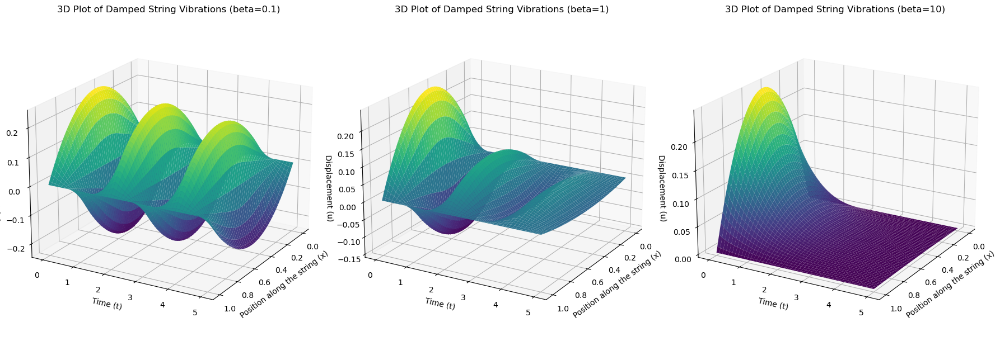

In [186]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from mpl_toolkits.mplot3d import Axes3D

# 参数设置
L = 1.0  # 绳子的长度
beta_values = [0.1, 1, 10]  # 不同的阻尼系数
N = 100  # 空间离散点数
x = np.linspace(0, L, N)  # 空间网格
dx = x[1] - x[0]  # 空间步长

# 初始条件
u0 = x * (L - x)  # 初始位移
ut0 = np.zeros(N)  # 初始速度

# 定义 PDE 的右侧
def damped_wave(t, u, beta):
    u_xx = np.zeros(N)
    u_xx[1:-1] = (u[:N-2] - 2*u[1:N-1] + u[2:N]) / dx**2  # 中心差分法
    u_xx[0] = u_xx[-1] = 0  # 边界条件
    return np.concatenate((u[N:], -beta*u[N:] + u_xx))

# 时间范围
t_span = (0, 5)  # 时间范围
t_eval = np.linspace(t_span[0], t_span[1], 500)  # 评估时间点

# 创建图形和子图
fig = plt.figure(figsize=(18, 6))

for i, beta in enumerate(beta_values):
    # 拼接初始条件
    u_init = np.concatenate((u0, ut0))
    
    # 求解 PDE
    sol = solve_ivp(damped_wave, t_span, u_init, args=(beta,), t_eval=t_eval)

    # 创建子图
    ax = fig.add_subplot(1, 3, i + 1, projection='3d')
    X, T = np.meshgrid(x, t_eval)
    U = sol.y[:N, :]

    # 绘制三维图
    ax.plot_surface(X, T, U.T, cmap='viridis')

    # 设置标签
    ax.set_title(f'3D Plot of Damped String Vibrations (beta={beta})')
    ax.set_xlabel('Position along the string (x)')
    ax.set_ylabel('Time (t)')
    ax.set_zlabel('Displacement (u)')

    # 设置视角
    ax.view_init(elev=20, azim=30)

plt.tight_layout()
plt.savefig('3ddamped.png', dpi=300, bbox_inches='tight')
plt.show()

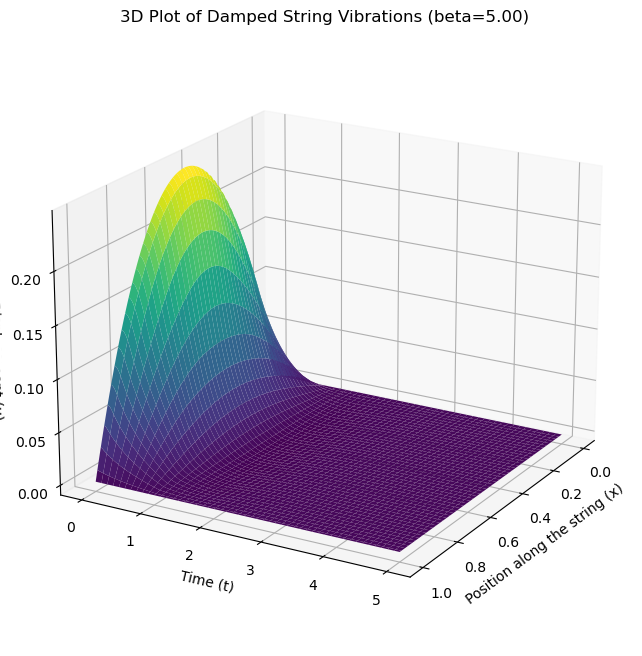

In [224]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

L = 1.0  
N = 100  
x = np.linspace(0, L, N)  
dx = x[1] - x[0]  

u0 = x * (L - x)  
ut0 = np.zeros(N)  


def damped_wave(t, u, beta):
    u_xx = np.zeros(N)
    u_xx[1:-1] = (u[:N-2] - 2*u[1:N-1] + u[2:N]) / dx**2  
    u_xx[0] = u_xx[-1] = 0  
    return np.concatenate((u[N:], -beta*u[N:] + u_xx))


t_span = (0, 5)  
t_eval = np.linspace(t_span[0], t_span[1], 500)  


fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
X, T = np.meshgrid(x, t_eval)


def update(beta):
    ax.clear()  
    u_init = np.concatenate((u0, ut0))
    

    sol = solve_ivp(damped_wave, t_span, u_init, args=(beta,), t_eval=t_eval)
    U = sol.y[:N, :]


    ax.plot_surface(X, T, U.T, cmap='viridis')


    ax.set_title(f'3D Plot of Damped String Vibrations (beta={beta:.2f})')
    ax.set_xlabel('Position along the string (x)')
    ax.set_ylabel('Time (t)')
    ax.set_zlabel('Displacement (u)')


    ax.view_init(elev=20, azim=30)


beta_values = np.linspace(0, 5, 100)  # 从0到5的beta值
ani = FuncAnimation(fig, update, frames=beta_values, repeat=False)


ani.save('/Users/amairo/damped_string_vibrations.gif', writer='pillow', fps=24)

plt.show()

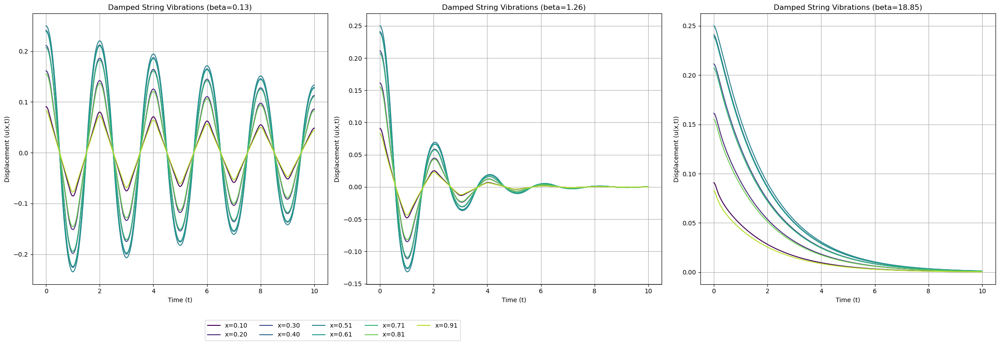

In [145]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Parameter settings
L = 1.0  # Length of the string
N = 100  # Number of spatial discretization points
x = np.linspace(0, L, N)  # Spatial grid
dx = x[1] - x[0]  # Spatial step size

# Initial conditions
u0 = x * (L - x)  # Initial displacement
ut0 = np.zeros(N)  # Initial velocity

# Define the right side of the PDE
def damped_wave(t, u, beta):
    u_xx = np.zeros(N)
    # Calculate u_xx, ensuring the shape of the slices matches
    u_xx[1:-1] = (u[:N-2] - 2 * u[1:N-1] + u[2:N]) / dx**2  # Central difference
    u_xx[0] = u_xx[-1] = 0  # Boundary conditions
    return np.concatenate((u[N:], -beta * u[N:] + u_xx))

# Concatenate initial conditions
u_init = np.concatenate((u0, ut0))

# Time range
t_span = (0, 10)  # Time range
t_eval = np.linspace(t_span[0], t_span[1], 500)  # Evaluation time points

# Different beta values to test
beta_values = [0.01 * (4 * np.pi) / L, 0.1 * (4 * np.pi) / L, 1.5 * (4 * np.pi) / L]

# Plotting
plt.figure(figsize=(15, 5))

# Create subplots for each beta value
for j, beta in enumerate(beta_values):
    # Solve the PDE for the current beta
    sol = solve_ivp(damped_wave, t_span, u_init, args=(beta,), t_eval=t_eval)
    
    plt.subplot(1, 3, j + 1)  # 1 row, 3 columns
    
    # Select multiple x positions (e.g., x = 0.1, 0.2, 0.3, ..., 0.9)
    x_positions = [int(N * pos) for pos in np.linspace(0.1, 0.9, 9)]  # Positions from x=0.1 to x=0.9
    
    # Use a colormap for coloring the curves
    colormap = plt.cm.viridis
    num_colors = len(x_positions)
    
    # Plot u(x,t) at different x positions for each beta
    for i, pos in enumerate(x_positions):
        color = colormap(i / num_colors)  # Get color from colormap based on index
        plt.plot(t_eval, sol.y[pos, :], label=f'x={x[pos]:.2f}', color=color)
    
    plt.title(f'Damped String Vibrations (beta={beta:.2f})')
    plt.xlabel('Time (t)')
    plt.ylabel('Displacement (u(x,t))')
    plt.grid()

# Add a single legend at the bottom
handles, labels = plt.gca().get_legend_handles_labels()
plt.figlegend(handles, labels, loc='lower center', ncol=5, bbox_to_anchor=(0.5, -0.05))

plt.tight_layout(rect=[0, 0.1, 1.5, 1.5])  # Adjust layout to prevent overlap
plt.show()


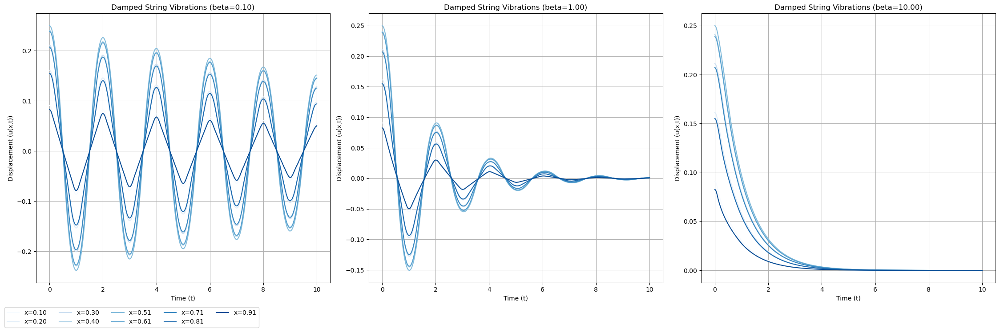

In [170]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Parameter settings
L = 1.0  # Length of the string
N = 100  # Number of spatial discretization points
x = np.linspace(0, L, N)  # Spatial grid
dx = x[1] - x[0]  # Spatial step size

# Initial conditions
u0 = x * (L - x)  # Initial displacement
ut0 = np.zeros(N)  # Initial velocity

# Define the right side of the PDE
def damped_wave(t, u, beta):
    u_xx = np.zeros(N)
    # Calculate u_xx, ensuring the shape of the slices matches
    u_xx[1:-1] = (u[:N-2] - 2 * u[1:N-1] + u[2:N]) / dx**2  # Central difference
    u_xx[0] = u_xx[-1] = 0  # Boundary conditions
    return np.concatenate((u[N:], -beta * u[N:] + u_xx))

# Concatenate initial conditions
u_init = np.concatenate((u0, ut0))

# Time range
t_span = (0, 10)  # Time range
t_eval = np.linspace(t_span[0], t_span[1], 500)  # Evaluation time points

# Different beta values to test
beta_values = [0.1 , 1, 10]

# Plotting
plt.figure(figsize=(15, 5))

# Create subplots for each beta value
for j, beta in enumerate(beta_values):
    # Solve the PDE for the current beta
    sol = solve_ivp(damped_wave, t_span, u_init, args=(beta,), t_eval=t_eval)
    
    plt.subplot(1, 3, j + 1)  # 1 row, 3 columns
    
    # Select multiple x positions (e.g., x = 0.1, 0.2, 0.3, ..., 0.9)
    x_positions = [int(N * pos) for pos in np.linspace(0.1, 0.9, 9)]  # Positions from x=0.1 to x=0.9
    
    # Use the Blues colormap (blue color palette)
    colormap = plt.cm.Blues
    num_colors = len(x_positions)
    
    # Plot u(x,t) at different x positions for each beta
    for i, pos in enumerate(x_positions):
        color = colormap(i / num_colors)  # Get color from colormap based on index
        plt.plot(t_eval, sol.y[pos, :], label=f'x={x[pos]:.2f}', color=color)
    
    plt.title(f'Damped String Vibrations (beta={beta:.2f})')
    plt.xlabel('Time (t)')
    plt.ylabel('Displacement (u(x,t))')
    plt.grid()

# Change this line to move the legend
handles, labels = plt.gca().get_legend_handles_labels()
# If you want the legend in the left bottom corner
plt.figlegend(handles, labels, loc='lower left', ncol=5, bbox_to_anchor=(0.0, 0.0))
# Or if you want the legend in the right bottom corner
# plt.figlegend(handles, labels, loc='lower right', ncol=5, bbox_to_anchor=(1.0, -0.3))

plt.tight_layout(rect=[0, 0.1, 1.5, 1.5])  # Adjust layout to prevent overlap
# Save the figure to a file
plt.savefig('vibrations.png', dpi=300, bbox_inches='tight')

# Optionally, show the plot
plt.show()


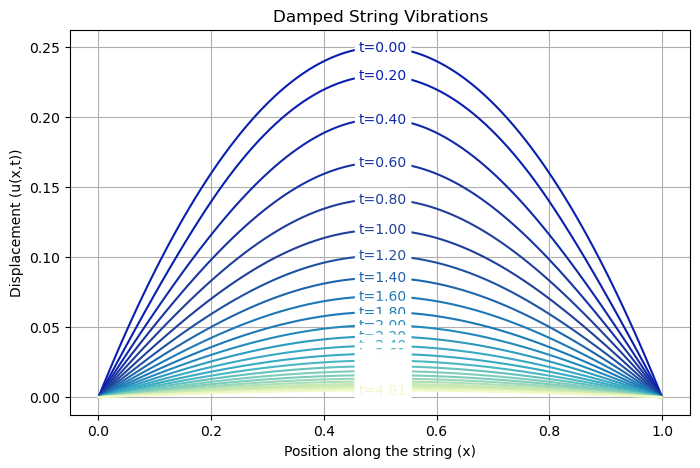

In [219]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Parameter settings
L = 1.0  # Length of the string
N = 100  # Number of spatial discretization points
x = np.linspace(0, L, N)  # Spatial grid
dx = x[1] - x[0]  # Spatial step size

# Initial conditions
u0 = x * (L - x)  # Initial displacement
ut0 = np.zeros(N)  # Initial velocity

# Define the right side of the PDE
def damped_wave(t, u, beta):
    u_xx = np.zeros(N)
    # Calculate u_xx, ensuring the shape of the slices matches
    u_xx[1:-1] = (u[:N-2] - 2 * u[1:N-1] + u[2:N]) / dx**2  # Central difference
    u_xx[0] = u_xx[-1] = 0  # Boundary conditions
    return np.concatenate((u[N:], -beta * u[N:] + u_xx))

# Concatenate initial conditions
u_init = np.concatenate((u0, ut0))

# Time range
t_span = (0, 5)  # Time range
t_eval = np.linspace(t_span[0], t_span[1], 500)  # Evaluation time points

# Set beta value to test
beta = 4 * np.pi / L

# Color palette
colors = [
    "#0A1FAE", "#1129A7", "#1934A0", "#203F9A", "#2051A1", 
    "#1F65AB", "#1D79B5", "#238ABB", "#2E9ABE", "#38AAC2", 
    "#4AB8C2", "#64C2BE", "#7ECDBB", "#97D6B8", "#AFDFB6", 
    "#C6E8B3", "#DBF0B3", "#E6F4BE", "#F1F8C8", "#FCFDD3"
]

# Plotting
plt.figure(figsize=(8, 5))

# Solve the PDE for the current beta
sol = solve_ivp(damped_wave, t_span, u_init, args=(beta,), t_eval=t_eval)

# Plot the results
num_colors = len(colors)

# Plot each time step with the color and label
for i in range(0, len(t_eval), 20):  # Plot every 20 time points
    color_index = int((i / 20) * (num_colors - 1) / (len(t_eval) // 20))
    label = f't={t_eval[i]:.2f}'  # Label to appear on the curve
    y_data = sol.y[:N, i]
    
    # Split the line in two halves and plot separately
    mid_index = len(x) // 2  # Middle index
    plt.plot(x[:mid_index], y_data[:mid_index], color=colors[color_index])  # Plot the first half
    plt.plot(x[mid_index:], y_data[mid_index:], color=colors[color_index])  # Plot the second half
    
    # Add label at the middle of the curve, between the two parts
    mid_value = y_data[mid_index]  # Mid-point value of the displacement
    plt.text(x[mid_index], mid_value, label, color=colors[color_index], fontsize=10, 
             verticalalignment='center', horizontalalignment='center', 
             bbox=dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0.3'))

# Add title and labels
plt.title(f'Damped String Vibrations')
plt.xlabel('Position along the string (x)')
plt.ylabel('Displacement (u(x,t))')
plt.grid()

# Adjust layout
#plt.tight_layout(rect=[0, 0.1, 1.5, 1.5])  # Adjust layout to prevent overlap

# Save the figure to a file
plt.savefig('4b.png', dpi=300, bbox_inches='tight')

# Optionally, show the plot
plt.show()

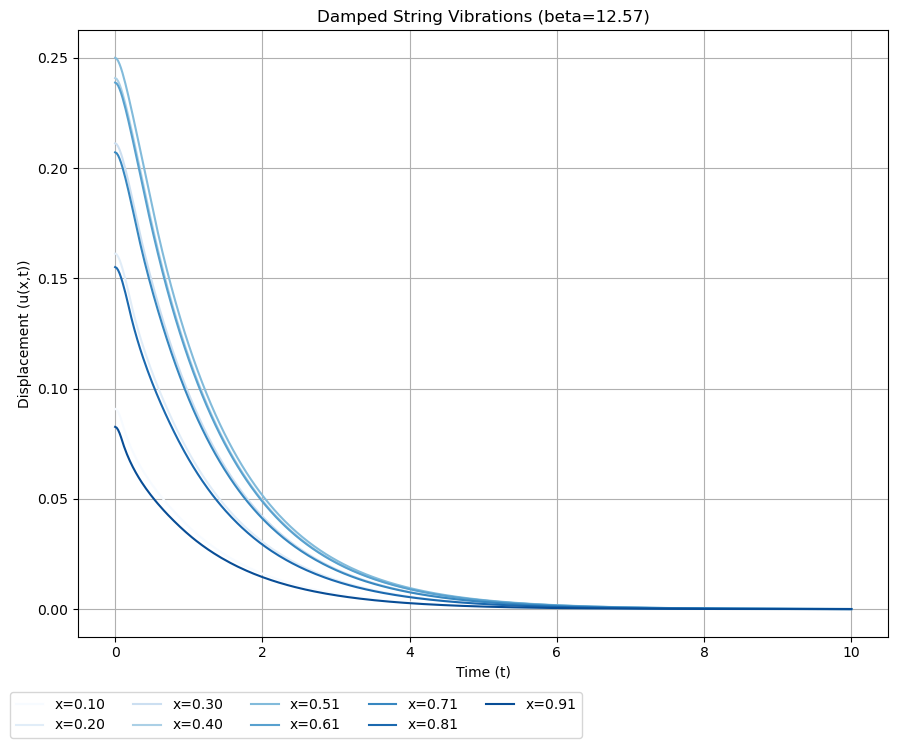

In [221]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Parameter settings
L = 1.0  # Length of the string
N = 100  # Number of spatial discretization points
x = np.linspace(0, L, N)  # Spatial grid
dx = x[1] - x[0]  # Spatial step size

# Initial conditions
u0 = x * (L - x)  # Initial displacement
ut0 = np.zeros(N)  # Initial velocity

# Define the right side of the PDE
def damped_wave(t, u, beta):
    u_xx = np.zeros(N)
    # Calculate u_xx, ensuring the shape of the slices matches
    u_xx[1:-1] = (u[:N-2] - 2 * u[1:N-1] + u[2:N]) / dx**2  # Central difference
    u_xx[0] = u_xx[-1] = 0  # Boundary conditions
    return np.concatenate((u[N:], -beta * u[N:] + u_xx))

# Concatenate initial conditions
u_init = np.concatenate((u0, ut0))

# Time range
t_span = (0, 10)  # Time range
t_eval = np.linspace(t_span[0], t_span[1], 500)  # Evaluation time points

# Set beta value to test
beta = 4 * np.pi / L

# Plotting
plt.figure(figsize=(6, 5))

# Solve the PDE for the current beta
sol = solve_ivp(damped_wave, t_span, u_init, args=(beta,), t_eval=t_eval)

# Select multiple x positions (e.g., x = 0.1, 0.2, 0.3, ..., 0.9)
x_positions = [int(N * pos) for pos in np.linspace(0.1, 0.9, 9)]  # Positions from x=0.1 to x=0.9

# Use the Blues colormap (blue color palette)
colormap = plt.cm.Blues
num_colors = len(x_positions)

# Plot u(x,t) at different x positions for the selected beta
for i, pos in enumerate(x_positions):
    color = colormap(i / num_colors)  # Get color from colormap based on index
    plt.plot(t_eval, sol.y[pos, :], label=f'x={x[pos]:.2f}', color=color)

plt.title(f'Damped String Vibrations (beta={beta:.2f})')
plt.xlabel('Time (t)')
plt.ylabel('Displacement (u(x,t))')
plt.grid()

# Change this line to move the legend
handles, labels = plt.gca().get_legend_handles_labels()
plt.figlegend(handles, labels, loc='lower left', ncol=5, bbox_to_anchor=(0.0, 0.0))

plt.tight_layout(rect=[0, 0.1, 1.5, 1.5])  # Adjust layout to prevent overlap
# Save the figure to a file
plt.savefig('4bbvibrations.png', dpi=300, bbox_inches='tight')

# Optionally, show the plot
plt.show()